# Scope, Closures and Decorators


## Variable Scopes

- local scope
- Global scope
- nonlocal scope
- nested scope


In [2]:
# print = lambda : "hello world"

### Module scopes are nested

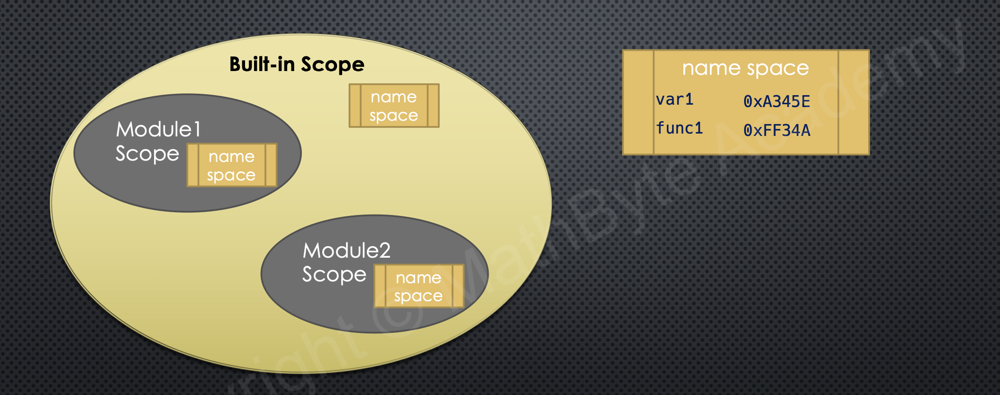


a new `print` variable exist in a `main` module, so It will call new defined `print` function instead of calling `print` from built-in scope. This is called masking


In [3]:
print()

### Local Scope

When a function is called a new scope is created to hold variables defined in the function. The actual assignment or binding to the variables can be different in each calls of the function. After finishing the call scope is cleaned up.

```
def my_func(a, b):
    c = a * b
    return c
```

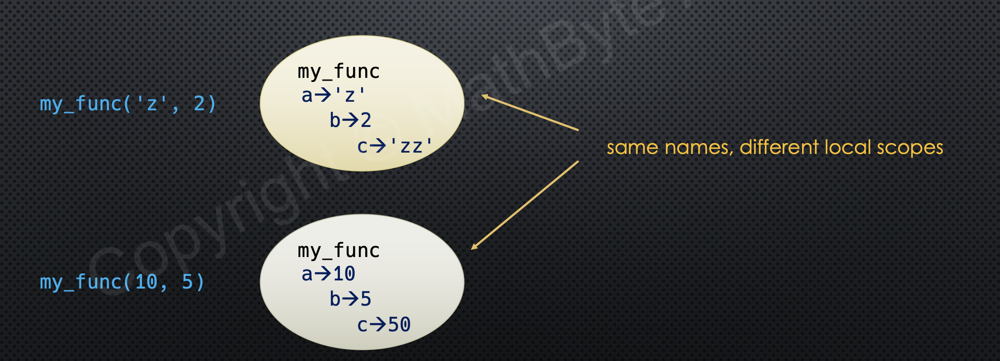


### Nesting of the function local scope

<div style="max-width:400px;margin: auto;">

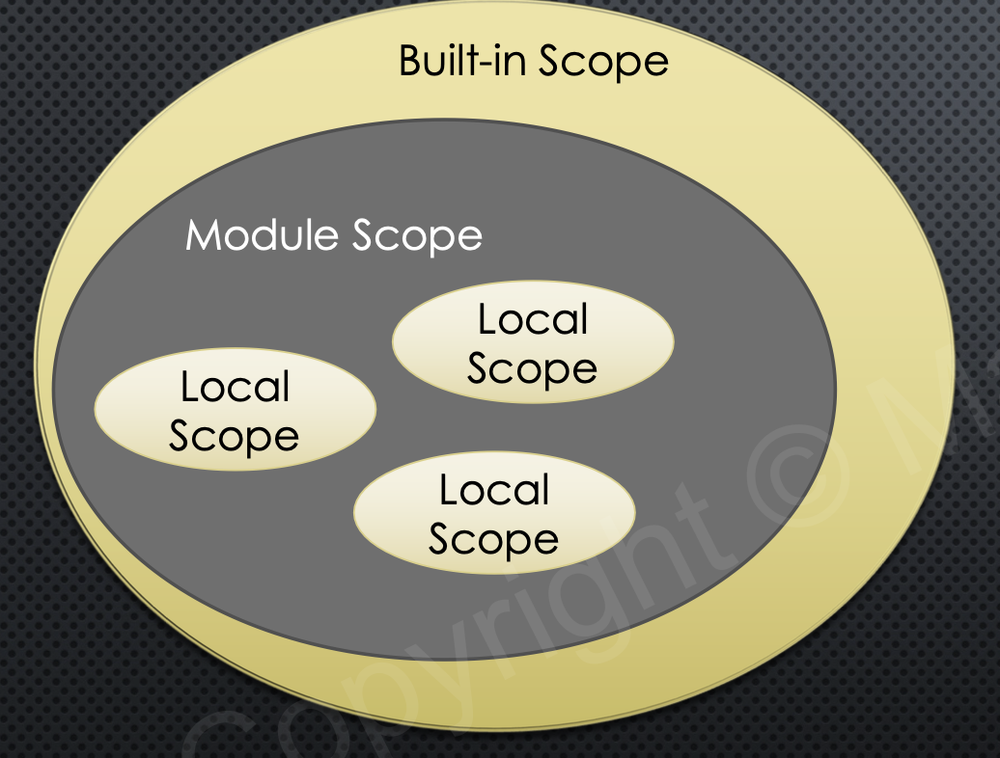

</div>


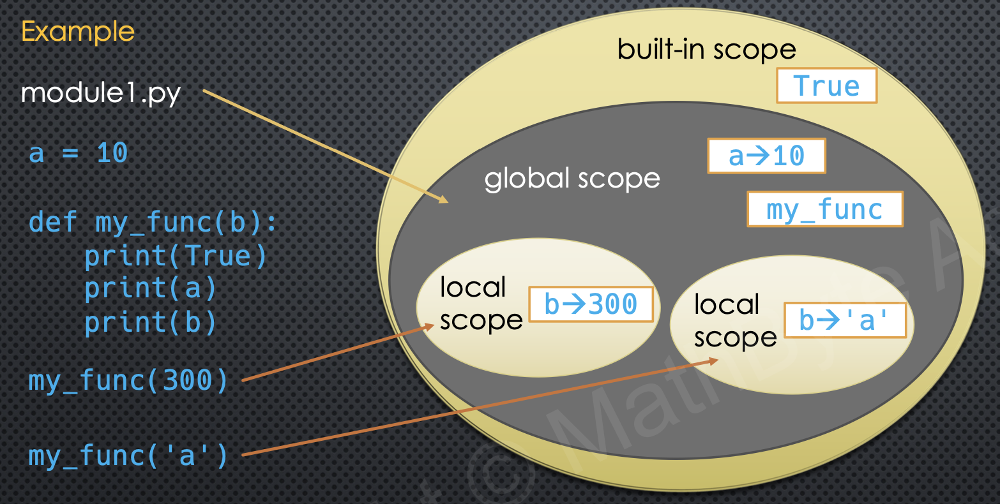


In [4]:
a = 21


def func():
    print(a)


func()

21


`global` keyword

used to access global scope inside local scope


In [5]:
a = 21


def func():
    # this a is local a
    a = 10


func()
print(a)

21


In [6]:
a = 21
print(id(a))


def func():
    global a  # declaring that from now on a will be taken from global scope for assigning
    print(id(a))
    a = 10


func()
print(a)

4370951088
4370951088
10


At compile time python checks for all the variable which are being assigned and if any variable doesn't have global declaration then variables will be in local scope. The decision, that which variable will be in the local space made based on the assignment operations in the function.


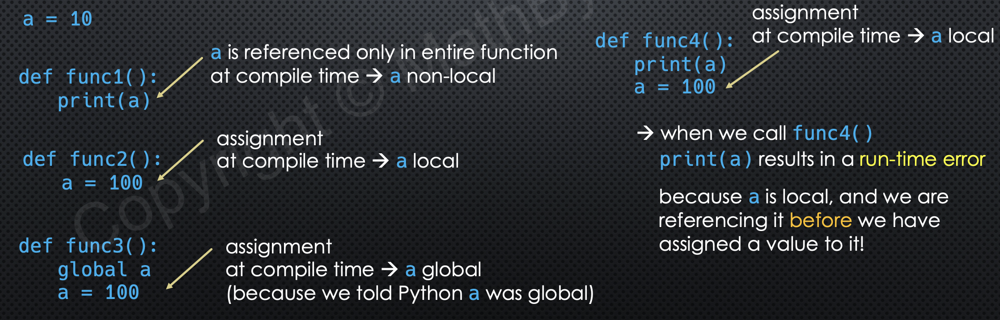


In [7]:
a = 21


def func():
    print(a)  # this will look for a in local namespace
    a = 10


func()

UnboundLocalError: local variable 'a' referenced before assignment

You can even define variable in the global scope from the local scope


In [ ]:
print(var)

NameError: name 'var' is not defined

In [ ]:
def fun():
    global var
    var = "value"

In [ ]:
fun()
print(var)

value


There is no block scope in Python like in other languages.


In [ ]:
for i in range(20):
    x = i * 2

print(x)

38


### Non-Local Scope

we can access non-local scope as per the normal lookup.


In [ ]:
def outer_func():
    a = 10

    def inner_func():
        print(a)  # Will be accessed from out_func's local scope

    inner_func()


outer_func()

10


Just as with global variable to modify nonlocal variable you have to specifically tell in inner function using `nonlocal` keyword. Note that It won't lookup to global scope.


```python
def outer():
    x = 10

    def inner1():
        def inner2():
            nonlocal x
            x = 20
        inner2()
    inner1()
    print(x)
```

<div style="max-width:400px;margin: auto;">

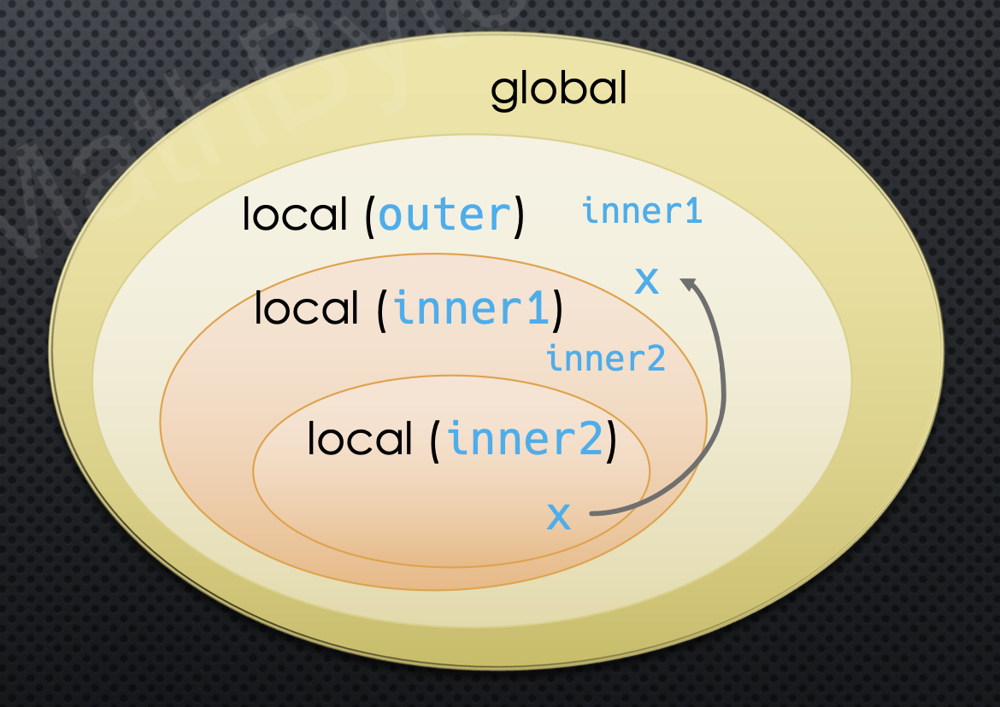

</div>


In [ ]:
def outer_func():
    a = 10

    def inner_func():
        a = 123

    inner_func()

    print(a)


outer_func()

10


In [ ]:
# accessing and modifying non-local variable
def outer_func():
    a = 10

    def inner_func():
        nonlocal a
        a = 123

    inner_func()

    print(a)


outer_func()

123


In [ ]:
def outer():
    x = 10

    def inner1():
        def inner2():
            nonlocal x
            x = 20

        # Note you can not call inner2 outside of the inner1 function
        inner2()

    inner1()
    print(x)

**Summary**

<div style="max-width:400px;margin: auto;">

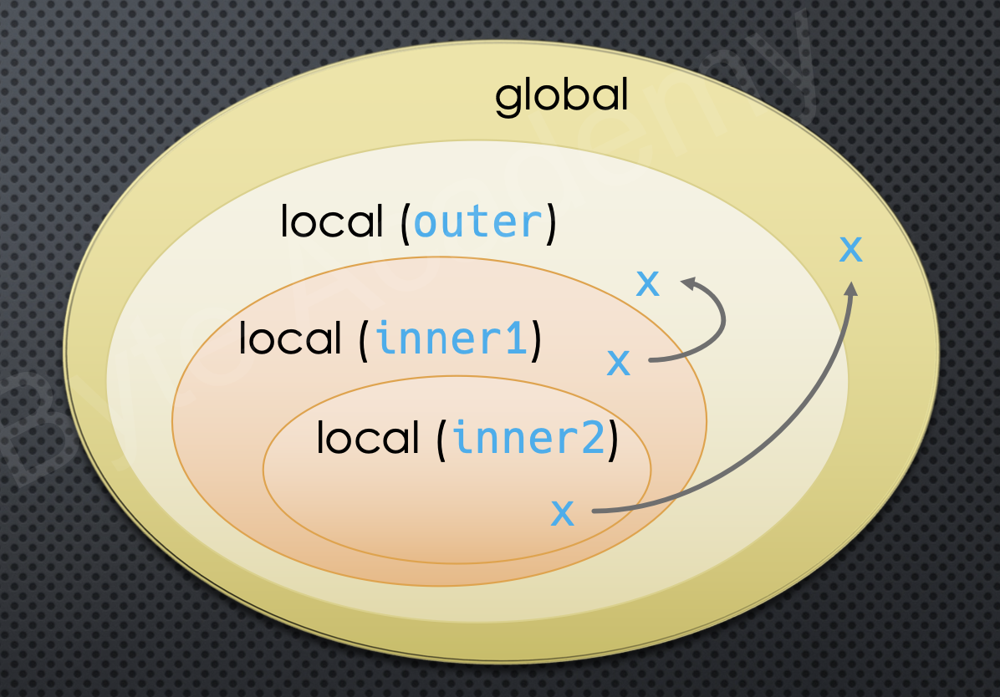

</div>


Note that - `nonlocal` will refer to the first non-local variable will be found from inner to outer ( child to parent) scope.


## Closures

- What they are?
- Closure scope


When we access a variable from non-local scope, a closure is created. A cell type of intermediate object is created and python does all double hoping automatically.


In [ ]:
def outer():
    # Both x variable are existed in the local scope only, so no free variables are created
    x = [1, 2, 3]
    print(hex(id(x)))

    def inner():
        x = [1, 2]
        print(hex(id(x)))

    print(inner.__closure__)
    print(inner.__code__.co_freevars)

    inner()

In [ ]:
outer()

0x107b86080
None
()
0x107b86480


In [ ]:
def outer():
    # Since we are accessing `x` inside the inner function, It will shared variable - free variable - with two scopes.
    x = [1, 2, 3]
    print(hex(id(x)))

    def inner():
        print(hex(id(x)))

    print(inner.__closure__)
    print(inner.__code__.co_freevars)

    inner()

In [ ]:
outer()

0x107b82c80
(<cell at 0x107557e20: list object at 0x107b82c80>,)
('x',)
0x107b82c80


#### Introspection


In [ ]:
def outer():
    a = "searce"
    x = "Taksh"

    def inner():
        a = "Google"
        print(f"{x} Panchal")

    print(hex(id(x)))
    return inner


fn = outer()

0x1075b1470


Note that the cloture has the same address as outer's x have


In [ ]:
fn()

Taksh Panchal


In [ ]:
print(fn.__code__.co_freevars)
print(fn.__code__.co_varnames)
print(fn.__closure__)

('x',)
('a',)
(<cell at 0x107a6d310: str object at 0x1075b1470>,)


#### Modifying free variables


In [ ]:
def create_cnter():
    count = 0

    def counter():
        nonlocal count
        count += 1
        return count

    return counter


fn = create_cnter()

In [ ]:
fn()

7

#### Multiple instances of closures


Difference instances of a closures will have different scopes.


In [ ]:
fn2 = create_cnter()

In [ ]:
print(fn())

8


In [ ]:
print(fn2())

3


Shared extended scope


Nested Closures

You can also create a closure inside a closure, and inner closure has access to free variables of parent.
It is pretty common in decorators.


In [ ]:
def create_inc_creator(n):
    def create_inc(start):
        # n is free variable here because I am accessing `n` inside inc function
        curr = start

        def inc():
            # n and curr both are free variable
            nonlocal curr
            curr += n

            return curr

        return inc

    return create_inc

In [ ]:
inc_creator = create_inc_creator(10)
print(inc_creator.__code__.co_freevars)

('n',)


In [ ]:
incrementor = inc_creator(start=0)
incrementor.__code__.co_freevars

('curr', 'n')

In [ ]:
incrementor()

50

## Application of Closures


#### very often class can be written as closure as well


In [ ]:
class Averager:
    def __init__(self):
        self.total = 0
        self.counter = 0

    def __call__(self, num):
        self.total += num
        self.counter += 1

        return self.total / self.counter

In [ ]:
avg = Averager()

In [ ]:
avg(10)

10.0

In [ ]:
print(avg(13))
print(avg(20))

12.0
14.0


In [ ]:
def avg_creator():
    total = 0
    n = 0

    def avg(num):
        nonlocal total, n
        total += num
        n += 1

        return total / n

    return avg

In [ ]:
avg_1 = avg_creator()

In [ ]:
print(avg_1(10))
print(avg_1(17))
print(avg_1(20))

10.0
13.5
15.666666666666666


#### A closure which counts, how many time it is called


In [ ]:
def counter(fn):
    cnter = 0

    def count(*args, **kwargs):
        nonlocal cnter
        cnter += 1
        print(f"{fn.__name__} is called {cnter} times")
        return fn(*args, **kwargs)

    return count

In [ ]:
def add(a, b=0):
    return a + b

In [ ]:
print_counter = counter(print)
add_counter = counter(add)

In [ ]:
print_counter("Hey This is a first call")
print_counter("Hey This is a second call")
print_counter("Hey This is a third call")

print is called 1 times
Hey This is a first call
print is called 2 times
Hey This is a second call
print is called 3 times
Hey This is a third call


In [ ]:
print(add_counter(3, 5))
print(add_counter(102))

add is called 2 times
8
add is called 3 times
102


Here, we are using closure to modify a function's behavior. Adding something extra in the functionality. This is called as decorating a function.


In [ ]:
print(add_counter.__closure__)
print(add_counter.__code__.co_freevars)

(<cell at 0x105a948b0: int object at 0x10299e970>, <cell at 0x105a94430: function object at 0x105d7d4c0>)
('cnter', 'fn')


Adding mop


In [ ]:
c = {}

In [ ]:
def counter(fn, counters):
    cnter = 0

    def count(*args, **kwargs):
        nonlocal cnter
        cnter += 1
        counters[
            fn.__name__
        ] = cnter  # No need to declare global bcz we are modifying the content of global variable, not global variable
        return fn(*args, **kwargs)

    return count

In [ ]:
print_counter = counter(print, c)
add_counter = counter(add, c)

In [ ]:
print_counter("Hey This is a first call")
print_counter("Hey This is a second call")
print_counter("Hey This is a third call")

c

Hey This is a first call
Hey This is a second call
Hey This is a third call


{'print': 6}

In [ ]:
print(add_counter(3, 5))
print(add_counter(102))

c

8
102


{'print': 6, 'add': 2}

We can make it simpler, to just naming the new function, as the same name. Why can't we? It will be having the same core functionality, just will have some additional decoration.


In [ ]:
fn_counts = {}

In [ ]:
print = counter(print, fn_counts)
add = counter(add, fn_counts)

In [ ]:
print("Hello there")
print("Hello there, again")
print("Hello there, thrice")
fn_counts

Hello there
Hello there, again
Hello there, thrice


{'print': 3}

This was the prologue of the decorators. so Let's start decorating functions, shall we?


## Decorators

- What they are?
- How they are related to closures
- convince of using `@`


Adding something extra to a function.


Qualities of a decorator function:

-
-

if `func` is a decorator function, then we decorate another function `my_func` by

`my_func = func(my_func)`

This pattern is so common in python so that, we have a shorter and convenient thing.

```
@func
def my_func(...):
    ....
```


Let's again write a decorator


In [ ]:
def counter(fn):
    cnter = 0

    def count(*args, **kwargs):
        nonlocal cnter
        cnter += 1
        print(f"{fn.__name__} is called {cnter} times")
        return fn(*args, **kwargs)

    return count

In [ ]:
@counter
def add(a, b=0):
    return a + b

In [ ]:
print(add(1, 2))
print(add(5, 6))

add is called 2 times
3
add is called 3 times
11


In [ ]:
del print

#### Introspection of decorated function

remember we can equally write, both ways are 100% equivalent.

`mult = counter(mult)`


In [ ]:
@counter
def mult(*args):
    """returns the multiplication of the given numbers"""
    m = 1
    for i in args:
        m *= i
    return m

`mult` is not pointing to the function we defined by `def`. It is changed. When you call `help`, it will print docstring of the closure function not the one which is defined. We have lost the docstring and all meta data about the function.


In [ ]:
print(mult.__name__)  # name has been changed to the inner function of the counter
print(help(mult))

count
Help on function count in module __main__:

count(*args, **kwargs)

None


A "Jugaad" way !!

well theoretically we can copy fn's metadata to inner function's metadata. But It is can't be done practically. We have to copy losts of stuff


In [ ]:
def counter(fn):
    cnter = 0

    def count(*args, **kwargs):
        nonlocal cnter
        cnter += 1
        print(f"{fn.__name__} is called {cnter} times")
        return fn(*args, **kwargs)

    count.__name__ = fn.__name__
    count.__doc__ = fn.__doc__

    return count

In [ ]:
@counter
def mult(*args: int):
    """returns the multiplication of the given numbers"""
    m = 1
    for i in args:
        m *= i
    return m

In [ ]:
print(mult.__name__)  # name has been changed to the inner function of the counter
(help(mult))

mult
Help on function mult in module __main__:

mult(*args, **kwargs)
    returns the multiplication of the given numbers



`functools.wraps` helps to maintain metadata of decorated function.


In [ ]:
from functools import wraps


def counter(fn):
    cnter = 0

    @wraps(fn)
    def count(*args, **kwargs):
        nonlocal cnter
        cnter += 1
        print(f"{fn.__name__} is called {cnter} times")
        return fn(*args, **kwargs)

    return count

In [ ]:
@counter
def mult(*args: int):
    """returns the multiplication of the given numbers"""
    m = 1
    for i in args:
        m *= i
    return m

In [ ]:
from inspect import signature

In [ ]:
print(mult.__name__)  # name has been changed to the inner function of the counter
(help(mult))
print(signature(mult))

mult
Help on function mult in module __main__:

mult(*args: int)
    returns the multiplication of the given numbers

(*args: int)


## Applications


#### Create a Timer


In [ ]:
def timer(fn):
    from functools import wraps
    from time import perf_counter

    @wraps(fn)
    def inner(*args, **kwargs):
        start = perf_counter()
        # for _ in range(rep):
        result = fn(*args, **kwargs)
        end = perf_counter()

        print(f"{fn.__name__} takes {(end - start)} time to run")
        return result

    return inner

In [ ]:
@timer
def compute(num):
    for i in range(1000000):
        2 * num

In [ ]:
compute(2**10000)

compute takes 0.5757792079994033 time to run


#### Logger | Stacked Decorator


In [ ]:
def logger(fn):
    from functools import wraps
    from datetime import datetime, timezone

    @wraps(fn)
    def inner(*args, **kwargs):
        res = fn(*args, **kwargs)
        print(f"{fn.__name__} is called at {datetime.now(timezone.utc)}")
        return res

    return inner

In [ ]:
@logger
def func_1():
    pass

In [ ]:
func_1()

func_1 is called at 2023-07-21 11:51:55.950960+00:00


In [ ]:
@timer
@logger
def factorial(n):
    from operator import mul
    from functools import reduce

    return reduce(mul, range(1, n + 1))


print(factorial(2))
print(factorial(6))

factorial is called at 2023-07-21 11:55:21.014833+00:00
factorial takes 4.208300003938348e-05 time to run
2
factorial is called at 2023-07-21 11:55:21.014895+00:00
factorial takes 7.2499999532738e-06 time to run
720


equivalent


In [ ]:
factorial = timer(logger(factorial))

#### Memoization


Taking example of fibonacci series


In [ ]:
def fib(n):
    print(f"calculating fib({n})")
    return 1 if n < 3 else fib(n - 1) + fib(n - 2)

In [ ]:
fib(8)

calculating fib(8)
calculating fib(7)
calculating fib(6)
calculating fib(5)
calculating fib(4)
calculating fib(3)
calculating fib(2)
calculating fib(1)
calculating fib(2)
calculating fib(3)
calculating fib(2)
calculating fib(1)
calculating fib(4)
calculating fib(3)
calculating fib(2)
calculating fib(1)
calculating fib(2)
calculating fib(5)
calculating fib(4)
calculating fib(3)
calculating fib(2)
calculating fib(1)
calculating fib(2)
calculating fib(3)
calculating fib(2)
calculating fib(1)
calculating fib(6)
calculating fib(5)
calculating fib(4)
calculating fib(3)
calculating fib(2)
calculating fib(1)
calculating fib(2)
calculating fib(3)
calculating fib(2)
calculating fib(1)
calculating fib(4)
calculating fib(3)
calculating fib(2)
calculating fib(1)
calculating fib(2)


21

#### Memoization with class


In [ ]:
class Fib:
    def __init__(self):
        self.cache = {1: 1, 2: 1}

    def __call__(self, n):
        if n in self.cache:
            return self.cache[n]
        print(f"calculating fib({n})")
        self.cache[n] = 1 if n < 3 else self(n - 1) + self(n - 2)
        return self.cache[n]

In [ ]:
fib = Fib()
fib(7)

calculating fib(7)
calculating fib(6)
calculating fib(5)
calculating fib(4)
calculating fib(3)


13

#### Memoization with closure


In [ ]:
def fib_generator():
    cache = {1: 1, 2: 1}

    def inner(n):
        if n in cache:
            return cache[n]
        print(f"calculating fib({n})")
        cache[n] = inner(n - 1) + inner(n - 2)
        return cache[n]

    return inner

In [ ]:
fib = fib_generator()

In [ ]:
fib(7)

calculating fib(7)
calculating fib(6)
calculating fib(5)
calculating fib(4)
calculating fib(3)


13

In [ ]:
def cacheable(fn):
    cache = {}

    def inner(*args, **kwargs):
        return fn(
            *args,
            cache=cache,
            **kwargs,
        )

    return inner

In [ ]:
@cacheable
def fib(n, cache=None):
    if n in cache:
        return cache[n]

    if n < 3:
        return 1

    print(f"calculating fib({n})")
    cache[n] = fib(n - 1) + fib(n - 2)
    return cache[n]

In [ ]:
fib(10)

NameError: name 'fib' is not defined

Another approach can be..


In [20]:
def cacheable(fn):
    cache = {}

    def inner(key):
        if key not in cache:
            print(f"calling {fn.__name__} for key {key}")
            cache[key] = fn(key)
        return cache[key]

    return inner

In [21]:
@cacheable
def fib(n):
    return 1 if n < 3 else fib(n - 1) + fib(n - 2)

In [23]:
fib(10)

55

In [24]:
fib(17)

calling fib for key 17
calling fib for key 16
calling fib for key 15
calling fib for key 14
calling fib for key 13
calling fib for key 12
calling fib for key 11


1597

In [25]:
fib(35)

calling fib for key 35
calling fib for key 34
calling fib for key 33
calling fib for key 32
calling fib for key 31
calling fib for key 30
calling fib for key 29
calling fib for key 28
calling fib for key 27
calling fib for key 26
calling fib for key 25
calling fib for key 24
calling fib for key 23
calling fib for key 22
calling fib for key 21
calling fib for key 20
calling fib for key 19
calling fib for key 18


9227465

There are a few problems with this implementation : 

- We are limited to the single number key size; the Key should be generated from args and kwargs for 
more generalised functions.

- we are not limiting the cache size. There will be high memory usage for a large number of arguments. 

We can use Least Recently Using cache(LRU) cache implementation from `functools` module.

In [27]:
from functools import lru_cache

In [34]:
@lru_cache(maxsize=10)
def fib(n):
    print(f"Calculating fib({n})")
    return 1 if n < 3 else fib(n - 1) + fib(n - 2)

In [37]:
fib(11)

Calculating fib(11)


89

In [43]:
fib(4)

Calculating fib(4)


3

### Decorator Parameters